This notebook supports the repo implementing prompt-to-prompt on SDXL
https://github.com/RoyiRa/prompt-to-prompt-with-sdxl

In [1]:
!pip install transformers
!pip install diffusers
!pip install accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 4.6 MB/s eta 0:00:00


# Utils

In [2]:
from __future__ import annotations

import abc
from typing import Dict, List, Optional, Tuple, Union
import numpy as np
import torch
import torch.nn.functional as F
from diffusers.models.attention import Attention


class P2PCrossAttnProcessor:
    def __init__(self, controller, place_in_unet):
        super().__init__()
        self.controller = controller
        self.place_in_unet = place_in_unet

    def __call__(self, attn: Attention, hidden_states, encoder_hidden_states=None, attention_mask=None):
        batch_size, sequence_length, _ = hidden_states.shape
        attention_mask = attn.prepare_attention_mask(attention_mask, sequence_length, batch_size)

        query = attn.to_q(hidden_states)

        is_cross = encoder_hidden_states is not None
        encoder_hidden_states = encoder_hidden_states if encoder_hidden_states is not None else hidden_states
        key = attn.to_k(encoder_hidden_states)
        value = attn.to_v(encoder_hidden_states)

        query = attn.head_to_batch_dim(query)
        key = attn.head_to_batch_dim(key)
        value = attn.head_to_batch_dim(value)

        attention_probs = attn.get_attention_scores(query, key, attention_mask)

        # one line change
        self.controller(attention_probs, is_cross, self.place_in_unet)

        hidden_states = torch.bmm(attention_probs, value)
        hidden_states = attn.batch_to_head_dim(hidden_states)

        # linear proj
        hidden_states = attn.to_out[0](hidden_states)
        # dropout
        hidden_states = attn.to_out[1](hidden_states)

        return hidden_states


def create_controller(
    prompts: List[str], cross_attention_kwargs: Dict, num_inference_steps: int, tokenizer, device, attn_res
) -> AttentionControl:
    edit_type = cross_attention_kwargs.get("edit_type", None)
    local_blend_words = cross_attention_kwargs.get("local_blend_words", None)
    equalizer_words = cross_attention_kwargs.get("equalizer_words", None)
    equalizer_strengths = cross_attention_kwargs.get("equalizer_strengths", None)
    n_cross_replace = cross_attention_kwargs.get("n_cross_replace", 0.4)
    n_self_replace = cross_attention_kwargs.get("n_self_replace", 0.4)

    # only replace
    if edit_type == "replace" and local_blend_words is None:
        return AttentionReplace(
            prompts, num_inference_steps, n_cross_replace, n_self_replace, tokenizer=tokenizer, device=device, attn_res=attn_res
        )

    # replace + localblend
    if edit_type == "replace" and local_blend_words is not None:
        lb = LocalBlend(prompts, local_blend_words, tokenizer=tokenizer, device=device, attn_res=attn_res)
        return AttentionReplace(
            prompts, num_inference_steps, n_cross_replace, n_self_replace, lb, tokenizer=tokenizer, device=device, attn_res=attn_res
        )

    # only refine
    if edit_type == "refine" and local_blend_words is None:
        return AttentionRefine(
            prompts, num_inference_steps, n_cross_replace, n_self_replace, tokenizer=tokenizer, device=device, attn_res=attn_res
        )

    # refine + localblend
    if edit_type == "refine" and local_blend_words is not None:
        lb = LocalBlend(prompts, local_blend_words, tokenizer=tokenizer, device=device, attn_res=attn_res)
        return AttentionRefine(
            prompts, num_inference_steps, n_cross_replace, n_self_replace, lb, tokenizer=tokenizer, device=device, attn_res=attn_res
        )

    # only reweight
    if edit_type == "reweight" and local_blend_words is None:
        assert (
            equalizer_words is not None and equalizer_strengths is not None
        ), "To use reweight edit, please specify equalizer_words and equalizer_strengths."
        assert len(equalizer_words) == len(
            equalizer_strengths
        ), "equalizer_words and equalizer_strengths must be of same length."
        equalizer = get_equalizer(prompts[1], equalizer_words, equalizer_strengths, tokenizer=tokenizer)
        return AttentionReweight(
            prompts,
            num_inference_steps,
            n_cross_replace,
            n_self_replace,
            tokenizer=tokenizer,
            device=device,
            equalizer=equalizer,
            attn_res=attn_res,
        )

    # reweight and localblend
    if edit_type == "reweight" and local_blend_words:
        assert (
            equalizer_words is not None and equalizer_strengths is not None
        ), "To use reweight edit, please specify equalizer_words and equalizer_strengths."
        assert len(equalizer_words) == len(
            equalizer_strengths
        ), "equalizer_words and equalizer_strengths must be of same length."
        equalizer = get_equalizer(prompts[1], equalizer_words, equalizer_strengths, tokenizer=tokenizer)
        lb = LocalBlend(prompts, local_blend_words, tokenizer=tokenizer, device=device, attn_res=attn_res)
        return AttentionReweight(
            prompts,
            num_inference_steps,
            n_cross_replace,
            n_self_replace,
            tokenizer=tokenizer,
            device=device,
            equalizer=equalizer,
            attn_res=attn_res,
            local_blend=lb,
        )

    raise ValueError(f"Edit type {edit_type} not recognized. Use one of: replace, refine, reweight.")


class AttentionControl(abc.ABC):
    def step_callback(self, x_t):
        return x_t

    def between_steps(self):
        return

    @property
    def num_uncond_att_layers(self):
        return 0

    @abc.abstractmethod
    def forward(self, attn, is_cross: bool, place_in_unet: str):
        raise NotImplementedError

    def __call__(self, attn, is_cross: bool, place_in_unet: str):
        if self.cur_att_layer >= self.num_uncond_att_layers:
            h = attn.shape[0]
            attn[h // 2 :] = self.forward(attn[h // 2 :], is_cross, place_in_unet)
        self.cur_att_layer += 1
        if self.cur_att_layer == self.num_att_layers + self.num_uncond_att_layers:
            self.cur_att_layer = 0
            self.cur_step += 1
            self.between_steps()
        return attn

    def reset(self):
        self.cur_step = 0
        self.cur_att_layer = 0

    def __init__(self, attn_res=None):
        self.cur_step = 0
        self.num_att_layers = -1
        self.cur_att_layer = 0
        self.attn_res = attn_res


class EmptyControl(AttentionControl):
    def forward(self, attn, is_cross: bool, place_in_unet: str):
        return attn


class AttentionStore(AttentionControl):
    @staticmethod
    def get_empty_store():
        return {"down_cross": [], "mid_cross": [], "up_cross": [], "down_self": [], "mid_self": [], "up_self": []}

    def forward(self, attn, is_cross: bool, place_in_unet: str):
        key = f"{place_in_unet}_{'cross' if is_cross else 'self'}"
        if attn.shape[1] <= 32**2:  # avoid memory overhead
            self.step_store[key].append(attn)
        return attn

    def between_steps(self):
        if len(self.attention_store) == 0:
            self.attention_store = self.step_store
        else:
            for key in self.attention_store:
                for i in range(len(self.attention_store[key])):
                    self.attention_store[key][i] += self.step_store[key][i]
        self.step_store = self.get_empty_store()

    def get_average_attention(self):
        average_attention = {
            key: [item / self.cur_step for item in self.attention_store[key]] for key in self.attention_store
        }
        return average_attention

    def reset(self):
        super(AttentionStore, self).reset()
        self.step_store = self.get_empty_store()
        self.attention_store = {}

    def __init__(self, attn_res=None):
        super(AttentionStore, self).__init__(attn_res)
        self.step_store = self.get_empty_store()
        self.attention_store = {}



class LocalBlend:
    def __call__(self, x_t, attention_store):
        # note that this code works on the latent level!
        k = 1
        # maps = attention_store["down_cross"][2:4] + attention_store["up_cross"][:3]  # These are the numbers because we want to take layers that are 256 x 256, I think this can be changed to something smarter...like, get all attentions where thesecond dim is self.attn_res[0] * self.attn_res[1] in up and down cross.
        maps = [m for m in attention_store["down_cross"] + attention_store["mid_cross"] +  attention_store["up_cross"] if m.shape[1] == self.attn_res[0] * self.attn_res[1]]
        maps = [item.reshape(self.alpha_layers.shape[0], -1, 1, self.attn_res[0], self.attn_res[1], self.max_num_words) for item in maps]
        maps = torch.cat(maps, dim=1)
        maps = (maps * self.alpha_layers).sum(-1).mean(1) # since alpha_layers is all 0s except where we edit, the product zeroes out all but what we change. Then, the sum adds the values of the original and what we edit. Then, we average across dim=1, which is the number of layers.
        mask = F.max_pool2d(maps, (k * 2 + 1, k * 2 + 1), (1, 1), padding=(k, k))
        mask = F.interpolate(mask, size=(x_t.shape[2:]))
        mask = mask / mask.max(2, keepdims=True)[0].max(3, keepdims=True)[0]
        mask = mask.gt(self.threshold)

        mask = mask[:1] + mask[1:]
        mask = mask.to(torch.float16)

        x_t = x_t[:1] + mask * (x_t - x_t[:1]) # x_t[:1] is the original image. mask*(x_t - x_t[:1]) zeroes out the original image and removes the difference between the original and each image we are generating (mostly just one). Then, it applies the mask on the image. That is, it's only keeping the cells we want to generate.
        return x_t

    def __init__(
        self, prompts: List[str], words: [List[List[str]]], tokenizer, device, threshold=0.3, attn_res=None
    ):
        self.max_num_words = 77
        self.attn_res = attn_res

        alpha_layers = torch.zeros(len(prompts), 1, 1, 1, 1, self.max_num_words)
        for i, (prompt, words_) in enumerate(zip(prompts, words)):
            if isinstance(words_, str):
                words_ = [words_]
            for word in words_:
                ind = get_word_inds(prompt, word, tokenizer)
                alpha_layers[i, :, :, :, :, ind] = 1
        self.alpha_layers = alpha_layers.to(device) # a one-hot vector where the 1s are the words we modify (source and target)
        self.threshold = threshold


class AttentionControlEdit(AttentionStore, abc.ABC):
    def step_callback(self, x_t):
        if self.local_blend is not None:
            x_t = self.local_blend(x_t, self.attention_store)
        return x_t

    def replace_self_attention(self, attn_base, att_replace):
        if att_replace.shape[2] <= self.attn_res[0]**2:
            return attn_base.unsqueeze(0).expand(att_replace.shape[0], *attn_base.shape)
        else:
            return att_replace

    @abc.abstractmethod
    def replace_cross_attention(self, attn_base, att_replace):
        raise NotImplementedError

    def forward(self, attn, is_cross: bool, place_in_unet: str):
        super(AttentionControlEdit, self).forward(attn, is_cross, place_in_unet)
        if is_cross or (self.num_self_replace[0] <= self.cur_step < self.num_self_replace[1]):
            h = attn.shape[0] // (self.batch_size)
            attn = attn.reshape(self.batch_size, h, *attn.shape[1:])
            attn_base, attn_replace = attn[0], attn[1:]
            if is_cross:
                alpha_words = self.cross_replace_alpha[self.cur_step]
                attn_replace_new = (
                    self.replace_cross_attention(attn_base, attn_replace) * alpha_words
                    + (1 - alpha_words) * attn_replace
                )
                attn[1:] = attn_replace_new
            else:
                attn[1:] = self.replace_self_attention(attn_base, attn_replace)
            attn = attn.reshape(self.batch_size * h, *attn.shape[2:])
        return attn

    def __init__(
        self,
        prompts,
        num_steps: int,
        cross_replace_steps: Union[float, Tuple[float, float], Dict[str, Tuple[float, float]]],
        self_replace_steps: Union[float, Tuple[float, float]],
        local_blend: Optional[LocalBlend],
        tokenizer,
        device,
        attn_res=None,
    ):
        super(AttentionControlEdit, self).__init__(attn_res=attn_res)
        # add tokenizer and device here

        self.tokenizer = tokenizer
        self.device = device

        self.batch_size = len(prompts)
        self.cross_replace_alpha = get_time_words_attention_alpha(
            prompts, num_steps, cross_replace_steps, self.tokenizer
        ).to(self.device)
        if isinstance(self_replace_steps, float):
            self_replace_steps = 0, self_replace_steps
        self.num_self_replace = int(num_steps * self_replace_steps[0]), int(num_steps * self_replace_steps[1])
        self.local_blend = local_blend


class AttentionReplace(AttentionControlEdit):
    def replace_cross_attention(self, attn_base, att_replace):
        return torch.einsum("hpw,bwn->bhpn", attn_base, self.mapper)

    def __init__(
        self,
        prompts,
        num_steps: int,
        cross_replace_steps: float,
        self_replace_steps: float,
        local_blend: Optional[LocalBlend] = None,
        tokenizer=None,
        device=None,
        attn_res=None,
    ):
        super(AttentionReplace, self).__init__(
            prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend, tokenizer, device, attn_res
        )
        self.mapper = get_replacement_mapper(prompts, self.tokenizer).to(self.device)


class AttentionRefine(AttentionControlEdit):
    def replace_cross_attention(self, attn_base, att_replace):
        attn_base_replace = attn_base[:, :, self.mapper].permute(2, 0, 1, 3)
        attn_replace = attn_base_replace * self.alphas + att_replace * (1 - self.alphas)
        return attn_replace

    def __init__(
        self,
        prompts,
        num_steps: int,
        cross_replace_steps: float,
        self_replace_steps: float,
        local_blend: Optional[LocalBlend] = None,
        tokenizer=None,
        device=None,
        attn_res=None
    ):
        super(AttentionRefine, self).__init__(
            prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend, tokenizer, device, attn_res
        )
        self.mapper, alphas = get_refinement_mapper(prompts, self.tokenizer)
        self.mapper, alphas = self.mapper.to(self.device), alphas.to(self.device)
        self.alphas = alphas.reshape(alphas.shape[0], 1, 1, alphas.shape[1])


class AttentionReweight(AttentionControlEdit):
    def replace_cross_attention(self, attn_base, att_replace):
        if self.prev_controller is not None:
            attn_base = self.prev_controller.replace_cross_attention(attn_base, att_replace)
        attn_replace = attn_base[None, :, :, :] * self.equalizer[:, None, None, :]
        return attn_replace

    def __init__(
        self,
        prompts,
        num_steps: int,
        cross_replace_steps: float,
        self_replace_steps: float,
        equalizer,
        local_blend: Optional[LocalBlend] = None,
        controller: Optional[AttentionControlEdit] = None,
        tokenizer=None,
        device=None,
        attn_res=None,
    ):
        super(AttentionReweight, self).__init__(
            prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend, tokenizer, device, attn_res
        )
        self.equalizer = equalizer.to(self.device)
        self.prev_controller = controller


### util functions for all Edits
def update_alpha_time_word(
    alpha, bounds: Union[float, Tuple[float, float]], prompt_ind: int, word_inds: Optional[torch.Tensor] = None
):
    if isinstance(bounds, float):
        bounds = 0, bounds
    start, end = int(bounds[0] * alpha.shape[0]), int(bounds[1] * alpha.shape[0])
    if word_inds is None:
        word_inds = torch.arange(alpha.shape[2])
    alpha[:start, prompt_ind, word_inds] = 0
    alpha[start:end, prompt_ind, word_inds] = 1
    alpha[end:, prompt_ind, word_inds] = 0
    return alpha


def get_time_words_attention_alpha(
    prompts, num_steps, cross_replace_steps: Union[float, Dict[str, Tuple[float, float]]], tokenizer, max_num_words=77
):
    if not isinstance(cross_replace_steps, dict):
        cross_replace_steps = {"default_": cross_replace_steps}
    if "default_" not in cross_replace_steps:
        cross_replace_steps["default_"] = (0.0, 1.0)
    alpha_time_words = torch.zeros(num_steps + 1, len(prompts) - 1, max_num_words)
    for i in range(len(prompts) - 1):
        alpha_time_words = update_alpha_time_word(alpha_time_words, cross_replace_steps["default_"], i)
    for key, item in cross_replace_steps.items():
        if key != "default_":
            inds = [get_word_inds(prompts[i], key, tokenizer) for i in range(1, len(prompts))]
            for i, ind in enumerate(inds):
                if len(ind) > 0:
                    alpha_time_words = update_alpha_time_word(alpha_time_words, item, i, ind)
    alpha_time_words = alpha_time_words.reshape(num_steps + 1, len(prompts) - 1, 1, 1, max_num_words)
    return alpha_time_words


### util functions for LocalBlend and ReplacementEdit
def get_word_inds(text: str, word_place: int, tokenizer):
    split_text = text.split(" ")
    if isinstance(word_place, str):
        word_place = [i for i, word in enumerate(split_text) if word_place == word]
    elif isinstance(word_place, int):
        word_place = [word_place]
    out = []
    if len(word_place) > 0:
        words_encode = [tokenizer.decode([item]).strip("#") for item in tokenizer.encode(text)][1:-1]
        cur_len, ptr = 0, 0

        for i in range(len(words_encode)):
            cur_len += len(words_encode[i])
            if ptr in word_place:
                out.append(i + 1)
            if cur_len >= len(split_text[ptr]):
                ptr += 1
                cur_len = 0
    return np.array(out)


### util functions for ReplacementEdit
def get_replacement_mapper_(x: str, y: str, tokenizer, max_len=77):
    words_x = x.split(" ")
    words_y = y.split(" ")
    if len(words_x) != len(words_y):
        raise ValueError(
            f"attention replacement edit can only be applied on prompts with the same length"
            f" but prompt A has {len(words_x)} words and prompt B has {len(words_y)} words."
        )
    inds_replace = [i for i in range(len(words_y)) if words_y[i] != words_x[i]]
    inds_source = [get_word_inds(x, i, tokenizer) for i in inds_replace]
    inds_target = [get_word_inds(y, i, tokenizer) for i in inds_replace]
    mapper = np.zeros((max_len, max_len))
    i = j = 0
    cur_inds = 0
    while i < max_len and j < max_len:
        if cur_inds < len(inds_source) and inds_source[cur_inds][0] == i:
            inds_source_, inds_target_ = inds_source[cur_inds], inds_target[cur_inds]
            if len(inds_source_) == len(inds_target_):
                mapper[inds_source_, inds_target_] = 1
            else:
                ratio = 1 / len(inds_target_)
                for i_t in inds_target_:
                    mapper[inds_source_, i_t] = ratio
            cur_inds += 1
            i += len(inds_source_)
            j += len(inds_target_)
        elif cur_inds < len(inds_source):
            mapper[i, j] = 1
            i += 1
            j += 1
        else:
            mapper[j, j] = 1
            i += 1
            j += 1

    # return torch.from_numpy(mapper).float()
    return torch.from_numpy(mapper).to(torch.float16)


def get_replacement_mapper(prompts, tokenizer, max_len=77):
    x_seq = prompts[0]
    mappers = []
    for i in range(1, len(prompts)):
        mapper = get_replacement_mapper_(x_seq, prompts[i], tokenizer, max_len)
        mappers.append(mapper)
    return torch.stack(mappers)


### util functions for ReweightEdit
def get_equalizer(
    text: str, word_select: Union[int, Tuple[int, ...]], values: Union[List[float], Tuple[float, ...]], tokenizer
):
    if isinstance(word_select, (int, str)):
        word_select = (word_select,)
    equalizer = torch.ones(len(values), 77)
    values = torch.tensor(values, dtype=torch.float32)
    for i, word in enumerate(word_select):
        inds = get_word_inds(text, word, tokenizer)
        equalizer[:, inds] = torch.FloatTensor(values[i])
    return equalizer


### util functions for RefinementEdit
class ScoreParams:
    def __init__(self, gap, match, mismatch):
        self.gap = gap
        self.match = match
        self.mismatch = mismatch

    def mis_match_char(self, x, y):
        if x != y:
            return self.mismatch
        else:
            return self.match


def get_matrix(size_x, size_y, gap):
    matrix = np.zeros((size_x + 1, size_y + 1), dtype=np.int32)
    matrix[0, 1:] = (np.arange(size_y) + 1) * gap
    matrix[1:, 0] = (np.arange(size_x) + 1) * gap
    return matrix


def get_traceback_matrix(size_x, size_y):
    matrix = np.zeros((size_x + 1, size_y + 1), dtype=np.int32)
    matrix[0, 1:] = 1
    matrix[1:, 0] = 2
    matrix[0, 0] = 4
    return matrix


def global_align(x, y, score):
    matrix = get_matrix(len(x), len(y), score.gap)
    trace_back = get_traceback_matrix(len(x), len(y))
    for i in range(1, len(x) + 1):
        for j in range(1, len(y) + 1):
            left = matrix[i, j - 1] + score.gap
            up = matrix[i - 1, j] + score.gap
            diag = matrix[i - 1, j - 1] + score.mis_match_char(x[i - 1], y[j - 1])
            matrix[i, j] = max(left, up, diag)
            if matrix[i, j] == left:
                trace_back[i, j] = 1
            elif matrix[i, j] == up:
                trace_back[i, j] = 2
            else:
                trace_back[i, j] = 3
    return matrix, trace_back


def get_aligned_sequences(x, y, trace_back):
    x_seq = []
    y_seq = []
    i = len(x)
    j = len(y)
    mapper_y_to_x = []
    while i > 0 or j > 0:
        if trace_back[i, j] == 3:
            x_seq.append(x[i - 1])
            y_seq.append(y[j - 1])
            i = i - 1
            j = j - 1
            mapper_y_to_x.append((j, i))
        elif trace_back[i][j] == 1:
            x_seq.append("-")
            y_seq.append(y[j - 1])
            j = j - 1
            mapper_y_to_x.append((j, -1))
        elif trace_back[i][j] == 2:
            x_seq.append(x[i - 1])
            y_seq.append("-")
            i = i - 1
        elif trace_back[i][j] == 4:
            break
    mapper_y_to_x.reverse()
    return x_seq, y_seq, torch.tensor(mapper_y_to_x, dtype=torch.int64)


def get_mapper(x: str, y: str, tokenizer, max_len=77):
    x_seq = tokenizer.encode(x)
    y_seq = tokenizer.encode(y)
    score = ScoreParams(0, 1, -1)
    matrix, trace_back = global_align(x_seq, y_seq, score)
    mapper_base = get_aligned_sequences(x_seq, y_seq, trace_back)[-1]
    alphas = torch.ones(max_len)
    alphas[: mapper_base.shape[0]] = mapper_base[:, 1].ne(-1).float()
    mapper = torch.zeros(max_len, dtype=torch.int64)
    mapper[: mapper_base.shape[0]] = mapper_base[:, 1]
    mapper[mapper_base.shape[0] :] = len(y_seq) + torch.arange(max_len - len(y_seq))
    return mapper, alphas


def get_refinement_mapper(prompts, tokenizer, max_len=77):
    x_seq = prompts[0]
    mappers, alphas = [], []
    for i in range(1, len(prompts)):
        mapper, alpha = get_mapper(x_seq, prompts[i], tokenizer, max_len)
        mappers.append(mapper)
        alphas.append(alpha)
    return torch.stack(mappers), torch.stack(alphas)


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

# Pipeline

In [3]:
from typing import Any, Callable, List
from diffusers.pipelines.stable_diffusion_xl.pipeline_output import StableDiffusionXLPipelineOutput
from diffusers.pipelines.stable_diffusion_xl import StableDiffusionXLPipeline


# Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.rescale_noise_cfg
def rescale_noise_cfg(noise_cfg, noise_pred_text, guidance_rescale=0.0):
    """
    Rescale `noise_cfg` according to `guidance_rescale`. Based on findings of [Common Diffusion Noise Schedules and
    Sample Steps are Flawed](https://arxiv.org/pdf/2305.08891.pdf). See Section 3.4
    """
    std_text = noise_pred_text.std(dim=list(range(1, noise_pred_text.ndim)), keepdim=True)
    std_cfg = noise_cfg.std(dim=list(range(1, noise_cfg.ndim)), keepdim=True)
    # rescale the results from guidance (fixes overexposure)
    noise_pred_rescaled = noise_cfg * (std_text / std_cfg)
    # mix with the original results from guidance by factor guidance_rescale to avoid "plain looking" images
    noise_cfg = guidance_rescale * noise_pred_rescaled + (1 - guidance_rescale) * noise_cfg
    return noise_cfg


class Prompt2PromptPipeline(StableDiffusionXLPipeline):
    r"""
    Args:
    Prompt-to-Prompt-Pipeline for text-to-image generation using Stable Diffusion. This model inherits from
    [`StableDiffusionPipeline`]. Check the superclass documentation for the generic methods the library implements for
    all the pipelines (such as downloading or saving, running on a particular device, etc.)
        vae ([`AutoencoderKL`]):
            Variational Auto-Encoder (VAE) Model to encode and decode images to and from latent representations.
        text_encoder ([`CLIPTextModel`]):
            Frozen text-encoder. Stable Diffusion uses the text portion of
            [CLIP](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel), specifically
            the [clip-vit-large-patch14](https://huggingface.co/openai/clip-vit-large-patch14) variant.
        tokenizer (`CLIPTokenizer`):
            Tokenizer of class
            [CLIPTokenizer](https://huggingface.co/docs/transformers/v4.21.0/en/model_doc/clip#transformers.CLIPTokenizer).
        unet ([`UNet2DConditionModel`]): Conditional U-Net architecture to denoise the encoded image latents. scheduler
        ([`SchedulerMixin`]):
            A scheduler to be used in combination with `unet` to denoise the encoded image latents. Can be one of
            [`DDIMScheduler`], [`LMSDiscreteScheduler`], or [`PNDMScheduler`].
        safety_checker ([`StableDiffusionSafetyChecker`]):
            Classification module that estimates whether generated images could be considered offensive or harmful.
            Please, refer to the [model card](https://huggingface.co/runwayml/stable-diffusion-v1-5) for details.
        feature_extractor ([`CLIPFeatureExtractor`]):
            Model that extracts features from generated images to be used as inputs for the `safety_checker`.
    """

    _optional_components = ["safety_checker", "feature_extractor"]

    def check_inputs(
            self,
            prompt,
            prompt_2,
            height,
            width,
            callback_steps,
            negative_prompt=None,
            negative_prompt_2=None,
            prompt_embeds=None,
            negative_prompt_embeds=None,
            pooled_prompt_embeds=None,
            negative_pooled_prompt_embeds=None,
    ):
        if height % 8 != 0 or width % 8 != 0:
            raise ValueError(f"`height` and `width` have to be divisible by 8 but are {height} and {width}.")

        if (callback_steps is None) or (
                callback_steps is not None and (not isinstance(callback_steps, int) or callback_steps <= 0)
        ):
            raise ValueError(
                f"`callback_steps` has to be a positive integer but is {callback_steps} of type"
                f" {type(callback_steps)}."
            )

        if prompt is not None and prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `prompt`: {prompt} and `prompt_embeds`: {prompt_embeds}. Please make sure to"
                " only forward one of the two."
            )
        elif prompt_2 is not None and prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `prompt_2`: {prompt_2} and `prompt_embeds`: {prompt_embeds}. Please make sure to"
                " only forward one of the two."
            )
        elif prompt is None and prompt_embeds is None:
            raise ValueError(
                "Provide either `prompt` or `prompt_embeds`. Cannot leave both `prompt` and `prompt_embeds` undefined."
            )
        elif prompt is not None and (not isinstance(prompt, str) and not isinstance(prompt, list)):
            raise ValueError(f"`prompt` has to be of type `str` or `list` but is {type(prompt)}")
        elif prompt_2 is not None and (not isinstance(prompt_2, str) and not isinstance(prompt_2, list)):
            raise ValueError(f"`prompt_2` has to be of type `str` or `list` but is {type(prompt_2)}")

        if negative_prompt is not None and negative_prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `negative_prompt`: {negative_prompt} and `negative_prompt_embeds`:"
                f" {negative_prompt_embeds}. Please make sure to only forward one of the two."
            )
        elif negative_prompt_2 is not None and negative_prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `negative_prompt_2`: {negative_prompt_2} and `negative_prompt_embeds`:"
                f" {negative_prompt_embeds}. Please make sure to only forward one of the two."
            )

        if prompt_embeds is not None and negative_prompt_embeds is not None:
            if prompt_embeds.shape != negative_prompt_embeds.shape:
                raise ValueError(
                    "`prompt_embeds` and `negative_prompt_embeds` must have the same shape when passed directly, but"
                    f" got: `prompt_embeds` {prompt_embeds.shape} != `negative_prompt_embeds`"
                    f" {negative_prompt_embeds.shape}."
                )

        if prompt_embeds is not None and pooled_prompt_embeds is None:
            raise ValueError(
                "If `prompt_embeds` are provided, `pooled_prompt_embeds` also have to be passed. Make sure to generate `pooled_prompt_embeds` from the same text encoder that was used to generate `prompt_embeds`."
            )

        if negative_prompt_embeds is not None and negative_pooled_prompt_embeds is None:
            raise ValueError(
                "If `negative_prompt_embeds` are provided, `negative_pooled_prompt_embeds` also have to be passed. Make sure to generate `negative_pooled_prompt_embeds` from the same text encoder that was used to generate `negative_prompt_embeds`."
            )

    def _aggregate_and_get_attention_maps_per_token(self, with_softmax):
        attention_maps = self.controller.aggregate_attention(
            from_where=("up_cross", "down_cross", "mid_cross"),
            # from_where=("up", "down"),
            # from_where=("down",)
        )
        attention_maps_list = self._get_attention_maps_list(
            attention_maps=attention_maps, with_softmax=with_softmax
        )
        return attention_maps_list

    @staticmethod
    def _get_attention_maps_list(
            attention_maps: torch.Tensor, with_softmax
    ) -> List[torch.Tensor]:
        attention_maps *= 100

        if with_softmax:
            attention_maps = torch.nn.functional.softmax(attention_maps, dim=-1)

        attention_maps_list = [
            attention_maps[:, :, i] for i in range(attention_maps.shape[2])
        ]
        return attention_maps_list

    @torch.no_grad()
    def __call__(
        self,
        prompt: Union[str, List[str]],
        prompt_2: Optional[Union[str, List[str]]] = None,
        height: Optional[int] = None,
        width: Optional[int] = None,
        num_inference_steps: int = 50,
        denoising_end: Optional[float] = None,
        guidance_scale: float = 7.5,
        negative_prompt: Optional[Union[str, List[str]]] = None,
        negative_prompt_2: Optional[Union[str, List[str]]] = None,
        num_images_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.FloatTensor] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.FloatTensor], None]] = None,
        callback_steps: Optional[int] = 1,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        guidance_rescale: float = 0.0,
        original_size: Optional[Tuple[int, int]] = None,
        crops_coords_top_left: Tuple[int, int] = (0, 0),
        target_size: Optional[Tuple[int, int]] = None,
        negative_original_size: Optional[Tuple[int, int]] = None,
        negative_crops_coords_top_left: Tuple[int, int] = (0, 0),
        negative_target_size: Optional[Tuple[int, int]] = None,
        attn_res=None,
    ):
        r"""
        Function invoked when calling the pipeline for generation.

        Args:
            prompt (`str` or `List[str]`):
                The prompt or prompts to guide the image generation.
            height (`int`, *optional*, defaults to self.unet.config.sample_size * self.vae_scale_factor):
                The height in pixels of the generated image.
            width (`int`, *optional*, defaults to self.unet.config.sample_size * self.vae_scale_factor):
                The width in pixels of the generated image.
            num_inference_steps (`int`, *optional*, defaults to 50):
                The number of denoising steps. More denoising steps usually lead to a higher quality image at the
                expense of slower inference.
            guidance_scale (`float`, *optional*, defaults to 7.5):
                Guidance scale as defined in [Classifier-Free Diffusion Guidance](https://arxiv.org/abs/2207.12598).
                `guidance_scale` is defined as `w` of equation 2. of [Imagen
                Paper](https://arxiv.org/pdf/2205.11487.pdf). Guidance scale is enabled by setting `guidance_scale >
                1`. Higher guidance scale encourages to generate images that are closely linked to the text `prompt`,
                usually at the expense of lower image quality.
            negative_prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts not to guide the image generation. Ignored when not using guidance (i.e., ignored
                if `guidance_scale` is less than `1`).
            num_images_per_prompt (`int`, *optional*, defaults to 1):
                The number of images to generate per prompt.
            eta (`float`, *optional*, defaults to 0.0):
                Corresponds to parameter eta (η) in the DDIM paper: https://arxiv.org/abs/2010.02502. Only applies to
                [`schedulers.DDIMScheduler`], will be ignored for others.
            generator (`torch.Generator`, *optional*):
                One or a list of [torch generator(s)](https://pytorch.org/docs/stable/generated/torch.Generator.html)
                to make generation deterministic.
            latents (`torch.FloatTensor`, *optional*):
                Pre-generated noisy latents, sampled from a Gaussian distribution, to be used as inputs for image
                generation. Can be used to tweak the same generation with different prompts. If not provided, a latents
                tensor will ge generated by sampling using the supplied random `generator`.
            output_type (`str`, *optional*, defaults to `"pil"`):
                The output format of the generate image. Choose between
                [PIL](https://pillow.readthedocs.io/en/stable/): `PIL.Image.Image` or `np.array`.
            return_dict (`bool`, *optional*, defaults to `True`):
                Whether or not to return a [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] instead of a
                plain tuple.
            callback (`Callable`, *optional*):
                A function that will be called every `callback_steps` steps during inference. The function will be
                called with the following arguments: `callback(step: int, timestep: int, latents: torch.FloatTensor)`.
            callback_steps (`int`, *optional*, defaults to 1):
                The frequency at which the `callback` function will be called. If not specified, the callback will be
                called at every step.
            cross_attention_kwargs (`dict`, *optional*):
                A kwargs dictionary that if specified is passed along to the [`AttentionProcessor`] as defined in
                [`self.processor`](https://github.com/huggingface/diffusers/blob/main/src/diffusers/models/attention_processor.py).

                The keyword arguments to configure the edit are:
                - edit_type (`str`). The edit type to apply. Can be either of `replace`, `refine`, `reweight`.
                - n_cross_replace (`int`): Number of diffusion steps in which cross attention should be replaced
                - n_self_replace (`int`): Number of diffusion steps in which self attention should be replaced
                - local_blend_words(`List[str]`, *optional*, default to `None`): Determines which area should be
                  changed. If None, then the whole image can be changed.
                - equalizer_words(`List[str]`, *optional*, default to `None`): Required for edit type `reweight`.
                  Determines which words should be enhanced.
                - equalizer_strengths (`List[float]`, *optional*, default to `None`) Required for edit type `reweight`.
                  Determines which how much the words in `equalizer_words` should be enhanced.

            guidance_rescale (`float`, *optional*, defaults to 0.0):
                Guidance rescale factor from [Common Diffusion Noise Schedules and Sample Steps are
                Flawed](https://arxiv.org/pdf/2305.08891.pdf). Guidance rescale factor should fix overexposure when
                using zero terminal SNR.

        Returns:
            [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] or `tuple`:
            [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] if `return_dict` is True, otherwise a `tuple.
            When returning a tuple, the first element is a list with the generated images, and the second element is a
            list of `bool`s denoting whether the corresponding generated image likely represents "not-safe-for-work"
            (nsfw) content, according to the `safety_checker`.
        """

        # 0. Default height and width to unet
        height = height or self.unet.config.sample_size * self.vae_scale_factor
        width = width or self.unet.config.sample_size * self.vae_scale_factor

        original_size = original_size or (height, width)
        target_size = target_size or (height, width)

        if attn_res is None:
            attn_res = int(np.ceil(width / 32)), int(np.ceil(height / 32))
        self.attn_res = attn_res

        self.controller = create_controller(
            prompt, cross_attention_kwargs, num_inference_steps, tokenizer=self.tokenizer, device=self.device, attn_res=self.attn_res
        )
        self.register_attention_control(self.controller)  # add attention controller

        # 1. Check inputs. Raise error if not correct
        self.check_inputs(
            prompt,
            prompt_2,
            height,
            width,
            callback_steps,
            negative_prompt,
            negative_prompt_2,
            prompt_embeds,
            negative_prompt_embeds,
            pooled_prompt_embeds,
            negative_pooled_prompt_embeds,
        )

        # 2. Define call parameters
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = self._execution_device
        # here `guidance_scale` is defined analog to the guidance weight `w` of equation (2)
        # of the Imagen paper: https://arxiv.org/pdf/2205.11487.pdf . `guidance_scale = 1`
        # corresponds to doing no classifier free guidance.
        do_classifier_free_guidance = guidance_scale > 1.0

        # 3. Encode input prompt
        text_encoder_lora_scale = (
            cross_attention_kwargs.get("scale", None) if cross_attention_kwargs is not None else None
        )
        (
            prompt_embeds,
            negative_prompt_embeds,
            pooled_prompt_embeds,
            negative_pooled_prompt_embeds,
        ) = self.encode_prompt(
            prompt=prompt,
            prompt_2=prompt_2,
            device=device,
            num_images_per_prompt=num_images_per_prompt,
            do_classifier_free_guidance=do_classifier_free_guidance,
            negative_prompt=negative_prompt,
            negative_prompt_2=negative_prompt_2,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            pooled_prompt_embeds=pooled_prompt_embeds,
            negative_pooled_prompt_embeds=negative_pooled_prompt_embeds,
            lora_scale=text_encoder_lora_scale,
        )

        # 4. Prepare timesteps
        self.scheduler.set_timesteps(num_inference_steps, device=device)
        timesteps = self.scheduler.timesteps

        # 5. Prepare latent variables
        num_channels_latents = self.unet.config.in_channels
        latents = self.prepare_latents(
            batch_size * num_images_per_prompt,
            num_channels_latents,
            height,
            width,
            prompt_embeds.dtype,
            device,
            generator,
            latents,
        )
        latents[1] = latents[0]


        # 6. Prepare extra step kwargs. TODO: Logic should ideally just be moved out of the pipeline
        extra_step_kwargs = self.prepare_extra_step_kwargs(generator, eta)

        # 7. Prepare added time ids & embeddings
        add_text_embeds = pooled_prompt_embeds
        add_time_ids = self._get_add_time_ids(
            original_size, crops_coords_top_left, target_size, dtype=prompt_embeds.dtype,
            text_encoder_projection_dim=self.text_encoder_2.config.projection_dim # if none should be changed to enc1
        )
        if negative_original_size is not None and negative_target_size is not None:
            negative_add_time_ids = self._get_add_time_ids(
                negative_original_size,
                negative_crops_coords_top_left,
                negative_target_size,
                dtype=prompt_embeds.dtype,
            )
        else:
            negative_add_time_ids = add_time_ids

        if do_classifier_free_guidance:
            prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds], dim=0)
            add_text_embeds = torch.cat([negative_pooled_prompt_embeds, add_text_embeds], dim=0)
            add_time_ids = torch.cat([negative_add_time_ids, add_time_ids], dim=0)

        prompt_embeds = prompt_embeds.to(device)
        add_text_embeds = add_text_embeds.to(device)
        add_time_ids = add_time_ids.to(device).repeat(batch_size * num_images_per_prompt, 1)

        # 8. Denoising loop
        num_warmup_steps = max(len(timesteps) - num_inference_steps * self.scheduler.order, 0)

        # 7.1 Apply denoising_end
        if denoising_end is not None and isinstance(denoising_end, float) and denoising_end > 0 and denoising_end < 1:
            discrete_timestep_cutoff = int(
                round(
                    self.scheduler.config.num_train_timesteps
                    - (denoising_end * self.scheduler.config.num_train_timesteps)
                )
            )
            num_inference_steps = len(list(filter(lambda ts: ts >= discrete_timestep_cutoff, timesteps)))
            timesteps = timesteps[:num_inference_steps]

        added_cond_kwargs = {"text_embeds": add_text_embeds, "time_ids": add_time_ids}
        with self.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                # expand the latents if we are doing classifier free guidance
                latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
                latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)

                # predict the noise residual
                noise_pred = self.unet(latent_model_input, t, encoder_hidden_states=prompt_embeds,
                                       added_cond_kwargs=added_cond_kwargs, ).sample

                # perform guidance
                if do_classifier_free_guidance:
                    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

                if do_classifier_free_guidance and guidance_rescale > 0.0:
                    # Based on 3.4. in https://arxiv.org/pdf/2305.08891.pdf
                    noise_pred = rescale_noise_cfg(noise_pred, noise_pred_text, guidance_rescale=guidance_rescale)

                # compute the previous noisy sample x_t -> x_t-1
                latents = self.scheduler.step(noise_pred, t, latents, **extra_step_kwargs).prev_sample

                # step callback
                latents = self.controller.step_callback(latents)

                # call the callback, if provided
                if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % self.scheduler.order == 0):
                    progress_bar.update()
                    if callback is not None and i % callback_steps == 0:
                        step_idx = i // getattr(self.scheduler, "order", 1)
                        callback(step_idx, t, latents)

        # 8. Post-processing
        if not output_type == "latent":
            # make sure the VAE is in float32 mode, as it overflows in float16
            needs_upcasting = self.vae.dtype == torch.float16 and self.vae.config.force_upcast

            if needs_upcasting:
                self.upcast_vae()
                latents = latents.to(next(iter(self.vae.post_quant_conv.parameters())).dtype)

            image = self.vae.decode(latents / self.vae.config.scaling_factor, return_dict=False)[0]

            # cast back to fp16 if needed
            if needs_upcasting:
                self.vae.to(dtype=torch.float16)
        else:
            image = latents

        if not output_type == "latent":
            # apply watermark if available
            if self.watermark is not None:
                image = self.watermark.apply_watermark(image)

            image = self.image_processor.postprocess(image, output_type=output_type)

        # Offload all models
        self.maybe_free_model_hooks()

        if not return_dict:
            return (image,)

        return StableDiffusionXLPipelineOutput(images=image)


    def register_attention_control(self, controller):
        attn_procs = {}
        cross_att_count = 0
        for name in self.unet.attn_processors.keys():
            None if name.endswith("attn1.processor") else self.unet.config.cross_attention_dim
            if name.startswith("mid_block"):
                self.unet.config.block_out_channels[-1]
                place_in_unet = "mid"
            elif name.startswith("up_blocks"):
                block_id = int(name[len("up_blocks.")])
                list(reversed(self.unet.config.block_out_channels))[block_id]
                place_in_unet = "up"
            elif name.startswith("down_blocks"):
                block_id = int(name[len("down_blocks.")])
                self.unet.config.block_out_channels[block_id]
                place_in_unet = "down"
            else:
                continue
            cross_att_count += 1
            attn_procs[name] = P2PCrossAttnProcessor(controller=controller, place_in_unet=place_in_unet)

        self.unet.set_attn_processor(attn_procs)
        controller.num_att_layers = cross_att_count



# Main

In [4]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
if device.type == "cuda":
    pipe = Prompt2PromptPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0",
                                                torch_dtype=torch.float16, use_safetensors=True).to(device)
else:
    pipe = Prompt2PromptPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0",
                                                torch_dtype=torch.float32, use_safetensors=False).to(device)

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [5]:
import torch
seed = 864
g_cpu = torch.Generator().manual_seed(seed)

# Replace

  0%|          | 0/50 [00:00<?, ?it/s]

Num images: 2


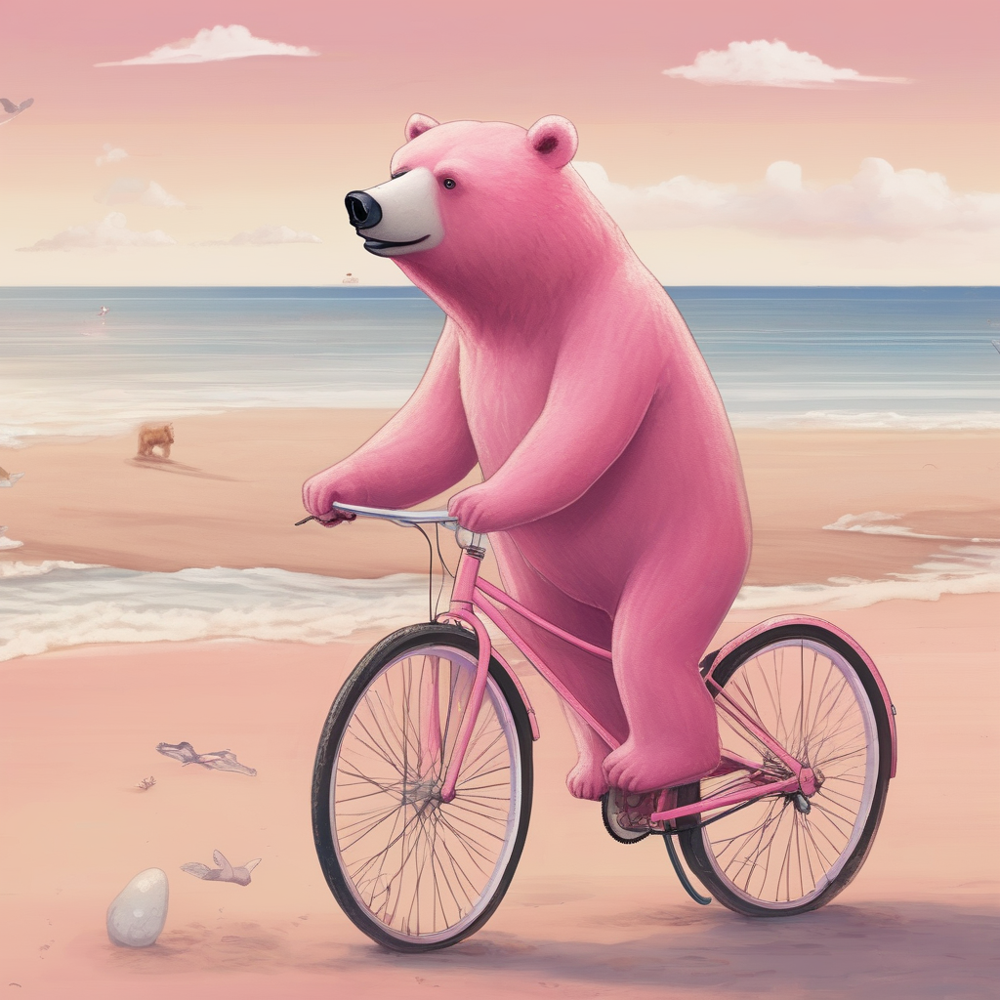

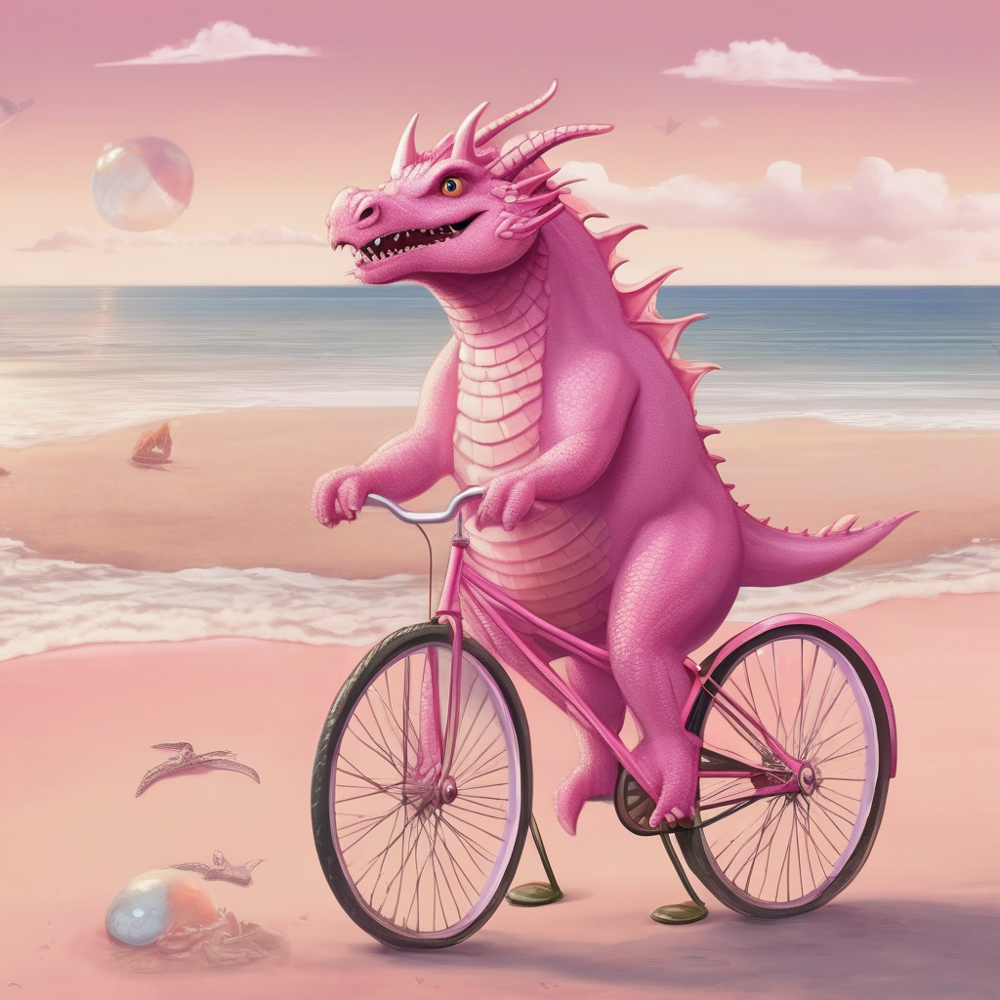

In [6]:
prompts = ["a pink bear riding a bicycle on the beach", "a pink dragon riding a bicycle on the beach"]
cross_attention_kwargs = {"edit_type": "replace",
                          "n_self_replace": 0.4,
                          "n_cross_replace": {"default_": 1.0, "dragon": 0.4},
                          }


image = pipe(prompts, cross_attention_kwargs=cross_attention_kwargs, generator=g_cpu)
print(f"Num images: {len(image['images'])}")
from IPython.display import display
for img in image['images']:
    display(img)

# Reweight

  0%|          | 0/50 [00:00<?, ?it/s]

Num images: 2


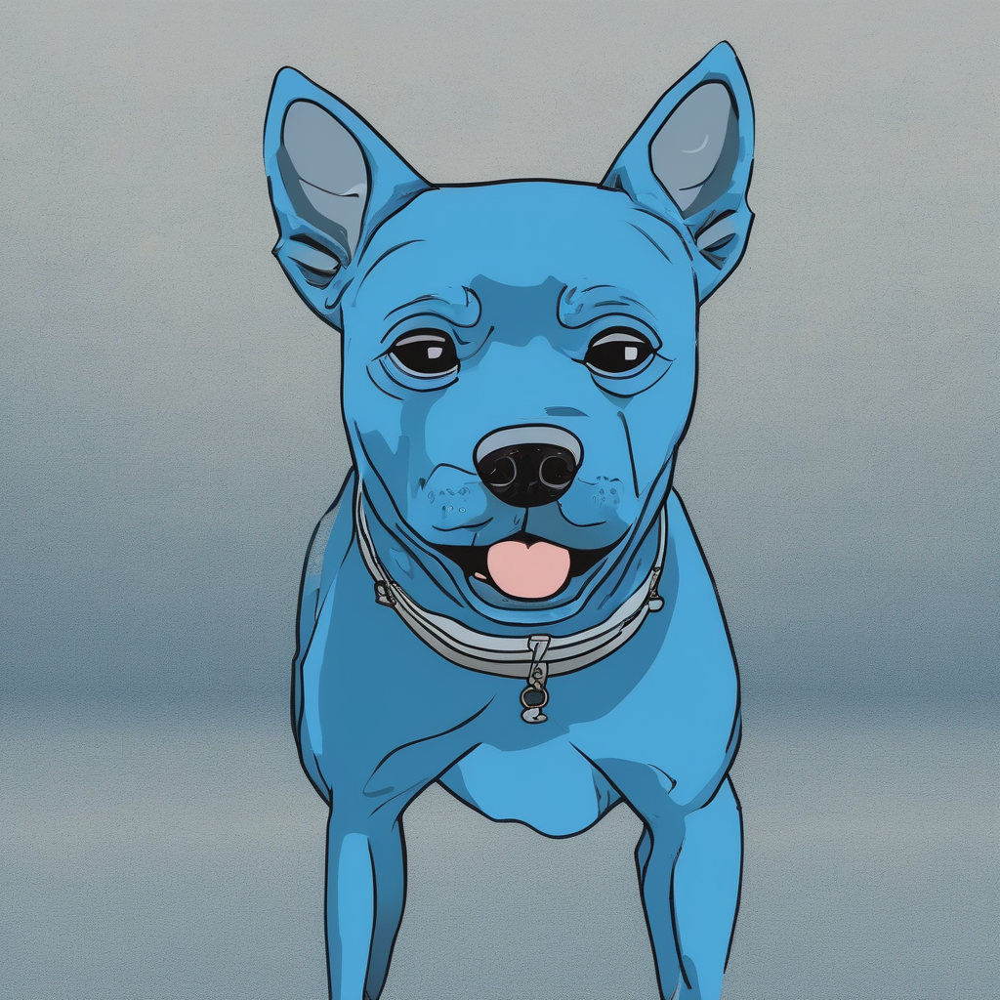

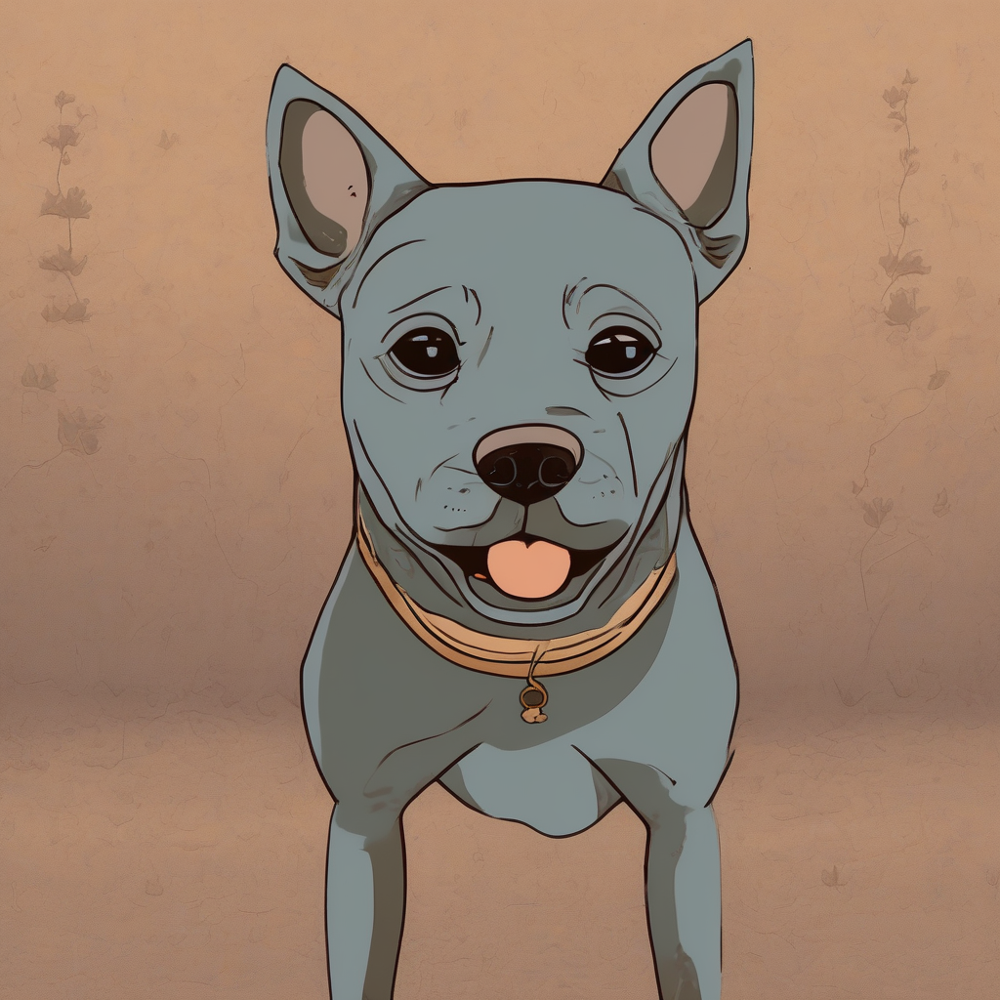

In [7]:
seed = 612
g_cpu = torch.Generator().manual_seed(seed)
prompts = ["a blue dog"] * 2
cross_attention_kwargs = {"edit_type": "reweight",
                          "n_self_replace": 0.4,
                          "n_cross_replace": {"default_": 1.0, "blue": 0.4},
                          "equalizer_words": ["blue"],
                          "equalizer_strengths": [-5],
                          "local_blend_words": ("blue", "blue")

                          }

image = pipe(prompts, cross_attention_kwargs=cross_attention_kwargs, generator=g_cpu)
print(f"Num images: {len(image['images'])}")
from IPython.display import display
for img in image['images']:
    display(img)

# Refine

  0%|          | 0/50 [00:00<?, ?it/s]

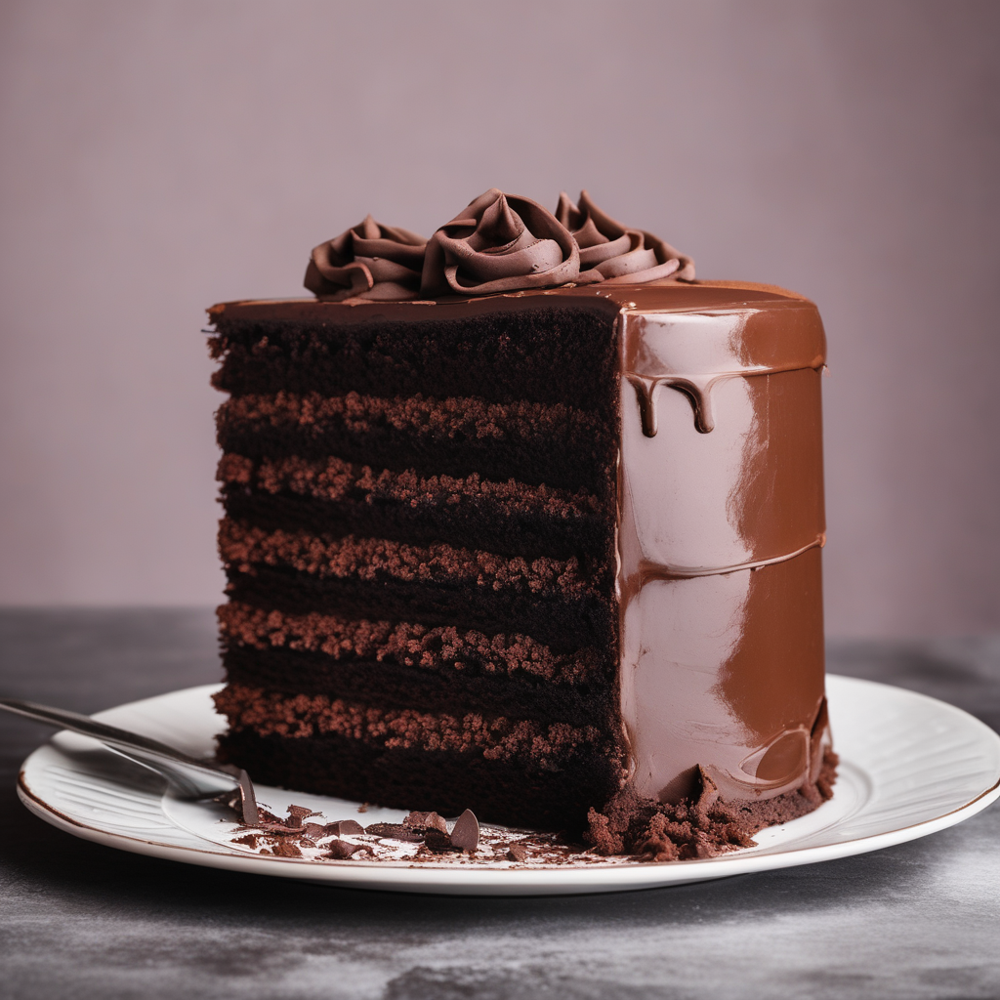

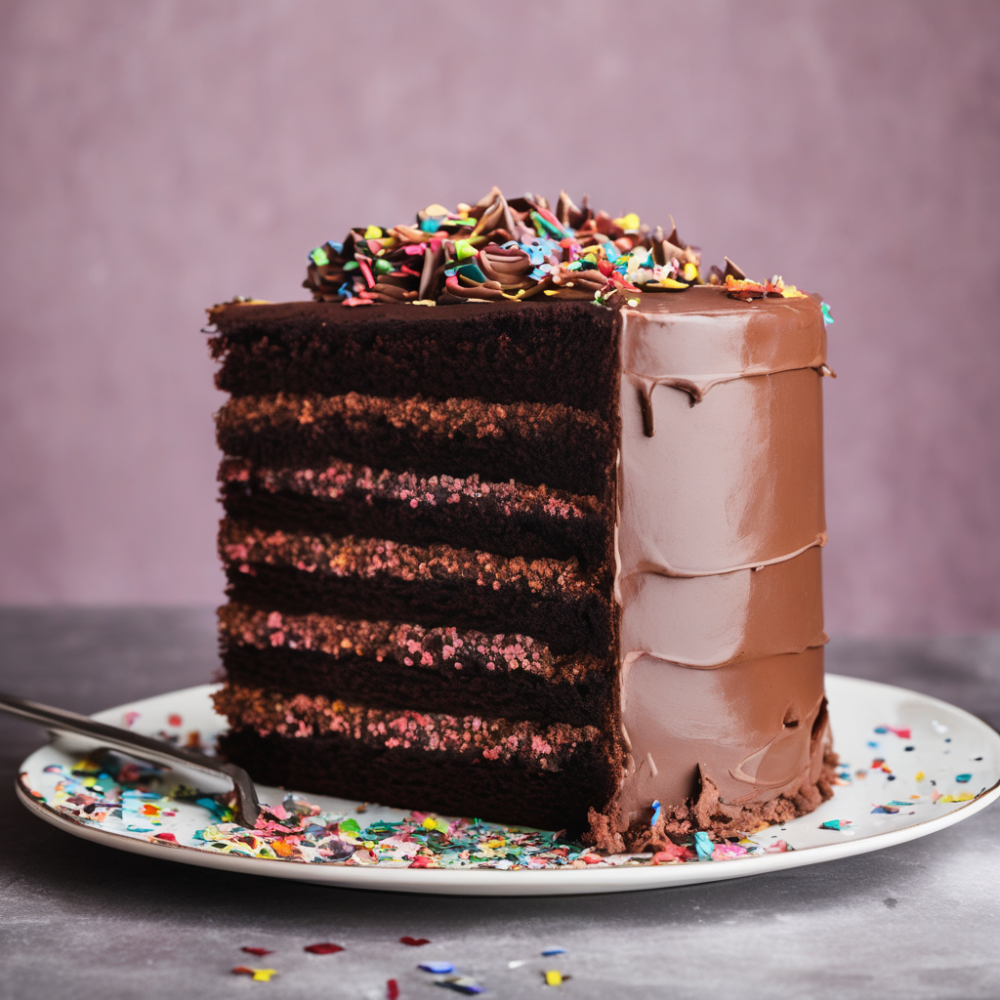

In [8]:
seed = 8888
g_cpu = torch.Generator().manual_seed(seed)
prompts = ["a chocolate cake", "a confetti chocolate cake"]
cross_attention_kwargs = {"edit_type": "refine",
                          "n_self_replace": 0.4,
                          "n_cross_replace": {"default_": 1.0, "confetti": 0.4},
                          }


image = pipe(prompts, cross_attention_kwargs=cross_attention_kwargs, generator=g_cpu)
from IPython.display import display
for img in image['images']:
    display(img)